# Регрессионный анализ

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy as sp
import seaborn as sns
import statsmodels.api as sm
import statsmodels.tsa.api as smt
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from statsmodels.stats.outliers_influence import variance_inflation_factor
%matplotlib inline

In [ ]:
df= pd.read_csv('TomsHardware.data', sep=',', header=None, names=['NCD_0', 'NCD_1', 'NCD_2', 'NCD_3', 'NCD_4', 'NCD_5', 'NCD_6', 'NCD_7', 'BL_0', 'BL_1', 'BL_2', 'BL_3', 'BL_4', 'BL_5', 'BL_6', 'BL_7', 'NAD_0', 'NAD_1', 'NAD_2', 'NAD_3', 'NAD_4', 'NAD_5', 'NAD_6', 'NAD_7', 'AI_0', 'AI_1', 'AI_2', 'AI_3', 'AI_4', 'AI_5', 'AI_6', 'AI_7', 'NAC_0', 'NAC_1', 'NAC_2', 'NAC_3', 'NAC_4', 'NAC_5', 'NAC_6', 'NAC_7', 'ND_0', 'ND_1', 'ND_2', 'ND_3', 'ND_4', 'ND_5', 'ND_6', 'ND_7', 'CS_0', 'CS_1', 'CS_2', 'CS_3', 'CS_4', 'CS_5', 'CS_6', 'CS_7', 'AT_0', 'AT_1', 'AT_2', 'AT_3', 'AT_4', 'AT_5', 'AT_6', 'AT_7', 'NA_0', 'NA_1', 'NA_2', 'NA_3', 'NA_4', 'NA_5', 'NA_6', 'NA_7', 'ADL_0', 'ADL_1', 'ADL_2', 'ADL_3', 'ADL_4', 'ADL_5', 'ADL_6', 'ADL_7', 'AS(NA)_0', 'AS(NA)_1', 'AS(NA)_2', 'AS(NA)_3', 'AS(NA)_4', 'AS(NA)_5', 'AS(NA)_6', 'AS(NA)_7', 'AS(NAC)_0', 'AS(NAC)_1', 'AS(NAC)_2', 'AS(NAC)_3', 'AS(NAC)_4', 'AS(NAC)_5', 'AS(NAC)_6', 'AS(NAC)_7', 'Target'])

In [13]:
print ("Total number of rows in dataset = {}".format(df.shape[0]))
print ("Total number of columns in dataset = {}".format(df.shape[1]))

Total number of rows in dataset = 28179
Total number of columns in dataset = 97


In [14]:
df.head()

,NCD_0,NCD_1,NCD_2,NCD_3,NCD_4,NCD_5,NCD_6,NCD_7,BL_0,BL_1,...,AS(NA)_7,AS(NAC)_0,AS(NAC)_1,AS(NAC)_2,AS(NAC)_3,AS(NAC)_4,AS(NAC)_5,AS(NAC)_6,AS(NAC)_7,Target
0,0,0,0,0,0,0,0,0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.5
1,0,0,0,0,0,0,0,0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.5
2,0,0,0,0,0,0,0,0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
3,0,0,0,0,0,0,0,0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0
4,0,0,0,0,0,0,0,0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.5


In [15]:
df.info()
df = df.dropna()
df.isna().sum()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28179 entries, 0 to 28178
Data columns (total 97 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   NCD_0      28179 non-null  int64  
 1   NCD_1      28179 non-null  int64  
 2   NCD_2      28179 non-null  int64  
 3   NCD_3      28179 non-null  int64  
 4   NCD_4      28179 non-null  int64  
 5   NCD_5      28179 non-null  int64  
 6   NCD_6      28179 non-null  int64  
 7   NCD_7      28179 non-null  int64  
 8   BL_0       28179 non-null  float64
 9   BL_1       28179 non-null  float64
 10  BL_2       28179 non-null  float64
 11  BL_3       28179 non-null  float64
 12  BL_4       28179 non-null  float64
 13  BL_5       28179 non-null  float64
 14  BL_6       28179 non-null  float64
 15  BL_7       28179 non-null  float64
 16  NAD_0      28179 non-null  int64  
 17  NAD_1      28179 non-null  int64  
 18  NAD_2      28179 non-null  int64  
 19  NAD_3      28179 non-null  int64  
 20  NAD_4 

NCD_0        0
NCD_1        0
NCD_2        0
NCD_3        0
NCD_4        0
            ..
AS(NAC)_4    0
AS(NAC)_5    0
AS(NAC)_6    0
AS(NAC)_7    0
Target       0
Length: 97, dtype: int64

По df.info() видим, что пустых значений нет. RangeIndex: 200 и Non-Null Count у всех признаков = 200.


In [16]:
target_col = "Target"

In [17]:
X = df.loc[:, df.columns != target_col]
y = df.loc[:, target_col]

In [18]:
# Split the data into train and test with 70% data being used for training
X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                                    test_size=0.30, 
                                                    random_state=42)


# Линейная регрессия (statsmodels)



In [19]:
X_with_constant = sm.add_constant(X_train)
model = sm.OLS(y_train, X_with_constant)

In [20]:
results = model.fit()
results.params

const            33.003468
NCD_0           124.045719
NCD_1            89.132123
NCD_2           -76.502465
NCD_3             4.908412
                 ...      
AS(NAC)_3     13424.836416
AS(NAC)_4    351318.545929
AS(NAC)_5   -183448.507109
AS(NAC)_6      4660.726806
AS(NAC)_7    -50776.679368
Length: 97, dtype: float64

In [21]:
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                 Target   R-squared:                       0.967
Model:                            OLS   Adj. R-squared:                  0.967
Method:                 Least Squares   F-statistic:                     5936.
Date:                Fri, 20 Jan 2023   Prob (F-statistic):               0.00
Time:                        11:15:11   Log-Likelihood:            -1.8096e+05
No. Observations:               19725   AIC:                         3.621e+05
Df Residuals:                   19628   BIC:                         3.629e+05
Df Model:                          96                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         33.0035     23.763      1.389      0.1

1. Коэффициенты регрессии модели Y = b0 + b1∙d1 + b2∙d2 + b3∙d3 + b4d4 + b5d5 + ... +b96d96:
b0  =  33.0035
b1  =  124.0457
b2  =  89.1321
b3  = -76.5025
b4	=  4.9084
b5  = -13.3764
b6	=  84.0391
b7  = -38.4527
b8  = -12.0855
b9  = -404.4011
b10 = -110.0675
b11 =  114.1955
b12 = -153.9490
b13 =  54.0755
b14 = -65.1780
b15 =  203.0888
b16 =  169.6192
b17 = -110.7470
b18 = -75.3310
b19 =  36.1837
b20 = -44.8058
b21 =  72.0889
b22 = -39.5950
b23 =  90.1240
b24 =  77.8682
b25 =  7.9228
b26 = -164.2350
b27 = -157.5995
b28 =  20.4082
b29 =  15.4079
b30 =  61.8941
b31 = -77.6345
b32 = -129.0582
b33 =  14.2519
b34 = -12.8776
b35 =  6.1088
b36 =  7.5368
b37 = -36.3455
b38 =  10.7154
b39 = -4.3835
b40 =  0.2865
b41 =  0.1252
b42 =  0.3893
b43 =  0.4172
b44 = -0.1738
b45 = -0.2448
b46 = -0.0248
b47 =  0.1268
b48 =  0.4666
b49 =  499.5672
b50 =  527.1914
b51 =  115.2770
b52 =  136.1825
b53 = -512.5243
b54 = -170.4022
b55 = -64.2007
b56 = -188.4288
b57 = -0.2922
b58 =  11.2431
b59 =  0.5915
b60 =  4.6625
b61 = -9.5424
b62 = -3.3218
b63 =  7.0751
b64 =  9.9376
b65 = -402.5523
b66 =  29.2262
b67 = -33.4108
b68 = -34.0329
b69 =  292.0624
b70 = -40.0379
b71 = -28.5148
b72 =  203.3401
b73 = -0.5323
b74 = -3.4095
b75 =  0.0771
b76 = -1.2756
b77 =  4.3452
b78 =  3.2532
b79 = -1.0209
b80 = -1.9740
b81 =  9.812e+05
b82 =  7.503e+04
b83 =  2.517e+05
b84 =  2.644e+04
b85 = -5.816e+05
b86 =  2.443e+04
b87 =  5.547e+04
b88 = -2.96e+05
b89 = -1.918e+05
b90 =  1.761e+05
b91 = -8.445e+04
b92 =  1.342e+04
b93 =  3.513e+05
b94 = -1.834e+05
b95 =  4660.7268
b97 = -5.078e+04

2. Коэффициент детерминации R-squared = 0.967, его скорректированная оценка Adj. R-squared = 0.966 - это означает, что регрессионная модель объясняет 96% вариации переменной Y.

3. Проверка значимости коэффициента детерминации:

>расчетное значение статистики критерия Фишера: F-statistic = 5986

>расчетный уровень значимости Prob (F-statistic) = 0

>так как значение Prob (F-statistic) < 0.05, то нулевая гипотеза R-squared = 0 НЕ ПРИНИМАЕТСЯ, т.е. коэффициент детерминации ЗНАЧИМ

4. Проверка значимости коэффициентов регрессии:

P>|t| 1 	 = 	 0.165 	-
P>|t| 2 	 = 	 0.000 	+
P>|t| 3 	 = 	 0.000 	+
P>|t| 4 	 = 	 0.000 	+
P>|t| 5 	 = 	 0.811 	-
P>|t| 6 	 = 	 0.547 	-
P>|t| 7	     = 	 0.000 	+
P>|t| 8	     = 	 0.079 	-
P>|t| 9	     = 	 0.622 	-
P>|t| 10	 = 	 0.000 	+
P>|t| 11	 = 	 0.158 	-
P>|t| 12	 = 	 0.123 	-
P>|t| 13	 = 	 0.033 	+
P>|t| 14	 = 	 0.456 	-
P>|t| 15	 = 	 0.363 	-
P>|t| 16	 = 	 0.004 	+
P>|t| 17	 = 	 0.021 	+
P>|t| 18	 = 	 0.000 	+
P>|t| 19	 = 	 0.000 	+
P>|t| 20	 = 	 0.027 	+
P>|t| 21	 = 	 0.006 	+
P>|t| 22	 = 	 0.000 	+
P>|t| 23	 = 	 0.022 	+
P>|t| 24	 = 	 0.000 	+
P>|t| 25	 = 	 0.000 	+
P>|t| 26	 = 	 0.552 	-
P>|t| 27	 = 	 0.000 	+
P>|t| 28	 = 	 0.000 	+
P>|t| 29	 = 	 0.085 	-
P>|t| 30	 = 	 0.179 	-
P>|t| 31	 = 	 0.000 	+
P>|t| 32	 = 	 0.000 	+
P>|t| 33	 = 	 0.000 	+
P>|t| 34	 = 	 0.000 	+
P>|t| 35	 = 	 0.000 	+
P>|t| 36	 = 	 0.000 	+
P>|t| 37	 = 	 0.000 	+
P>|t| 38	 = 	 0.000 	+
P>|t| 39	 = 	 0.000 	+
P>|t| 40	 = 	 0.036 	+
P>|t| 41	 = 	 0.879 	-
P>|t| 42	 = 	 0.000 	+
P>|t| 43	 = 	 0.000 	+
P>|t| 44	 = 	 0.000 	+
P>|t| 45	 = 	 0.000 	+
P>|t| 46	 = 	 0.000 	+
P>|t| 47	 = 	 0.000 	+
P>|t| 48	 = 	 0.000 	+
P>|t| 49	 = 	 0.000 	+
P>|t| 50	 = 	 0.161 	-
P>|t| 51	 = 	 0.147 	-
P>|t| 52	 = 	 0.744 	-
P>|t| 53	 = 	 0.684 	-
P>|t| 54	 = 	 0.130 	-
P>|t| 55	 = 	 0.617 	-
P>|t| 56	 = 	 0.849 	-
P>|t| 57	 = 	 0.593 	-
P>|t| 58	 = 	 0.940 	-
P>|t| 59	 = 	 0.007 	+
P>|t| 60	 = 	 0.884 	-
P>|t| 61	 = 	 0.245 	-
P>|t| 62	 = 	 0.017 	+
P>|t| 63	 = 	 0.402 	-
P>|t| 64	 = 	 0.068 	-
P>|t| 65	 = 	 0.011 	+
P>|t| 66	 = 	 0.000 	+
P>|t| 67	 = 	 0.056 	-
P>|t| 68	 = 	 0.031 	+
P>|t| 69	 = 	 0.038 	+
P>|t| 70	 = 	 0.000 	+
P>|t| 71	 = 	 0.011 	+
P>|t| 72	 = 	 0.086 	-
P>|t| 73	 = 	 0.000 	+
P>|t| 74	 = 	 0.726 	-
P>|t| 75	 = 	 0.035 	+
P>|t| 76	 = 	 0.961 	-
P>|t| 77	 = 	 0.405 	-
P>|t| 78	 = 	 0.003 	+
P>|t| 79	 = 	 0.025 	+
P>|t| 80	 = 	 0.462 	-
P>|t| 81	 = 	 0.140 	-
P>|t| 82	 = 	 0.000 	+
P>|t| 83	 = 	 0.021 	+
P>|t| 84	 = 	 0.000 	+
P>|t| 85	 = 	 0.428 	-
P>|t| 86	 = 	 0.000 	+
P>|t| 87	 = 	 0.385 	-
P>|t| 88	 = 	 0.061 	-
P>|t| 89	 = 	 0.000 	+
P>|t| 90	 = 	 0.000 	+
P>|t| 91	 = 	 0.000 	+
P>|t| 92	 = 	 0.000 	+
P>|t| 93	 = 	 0.558 	-
P>|t| 94	 = 	 0.000 	+
P>|t| 95	 = 	 0.000 	+
P>|t| 96	 = 	 0.837 	-
P>|t| 97	 = 	 0.008 	+

Для элементов, отмеченных знаком +, коэффициент P>|t| не превышает 0.05 - это означает, что коэффициенты регрессии значимы
об этом же свидетельствует то, что доверительный интервал для коэффициентов регрессии ([0.025; 0.975]) не включает в себя точку 0

Элементы, отмеченные знаком -, не являются значимыми, так как P>|t| превышает 0.05. Нулевая гипотеза не отвергается. Нулевая гипотеза - коэффициент равен нулю, альтернативная - не равен.


Удаляем признаки, которые не являются значимыми, и повторяем обучение без них.

In [22]:
dn = df.drop(columns=['Target','NCD_3','NCD_4','NCD_6','NCD_7','BL_1','BL_2','BL_4','BL_5','AI_0','AI_3','AI_4','NAC_7','CS_0','CS_1','CS_2','CS_3','CS_4','CS_5','CS_6','CS_7','AT_0','AT_2','AT_3','AT_5','AT_6','NA_1','NA_6','ADL_0','ADL_2','ADL_3','ADL_6','ADL_7','AS(NA)_3','AS(NA)_5','AS(NA)_6','AS(NAC)_3','AS(NAC)_6'])

dn = dn.drop(columns=['AS(NA)_0','AS(NA)_1','AS(NA)_2','AS(NA)_4','AS(NA)_7','AS(NAC)_0','AS(NAC)_1','AS(NAC)_2','AS(NAC)_4','AS(NAC)_5','AS(NAC)_7'])

dn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28179 entries, 0 to 28178
Data columns (total 48 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   NCD_0   28179 non-null  int64  
 1   NCD_1   28179 non-null  int64  
 2   NCD_2   28179 non-null  int64  
 3   NCD_5   28179 non-null  int64  
 4   BL_0    28179 non-null  float64
 5   BL_3    28179 non-null  float64
 6   BL_6    28179 non-null  float64
 7   BL_7    28179 non-null  float64
 8   NAD_0   28179 non-null  int64  
 9   NAD_1   28179 non-null  int64  
 10  NAD_2   28179 non-null  int64  
 11  NAD_3   28179 non-null  int64  
 12  NAD_4   28179 non-null  int64  
 13  NAD_5   28179 non-null  int64  
 14  NAD_6   28179 non-null  int64  
 15  NAD_7   28179 non-null  int64  
 16  AI_1    28179 non-null  int64  
 17  AI_2    28179 non-null  int64  
 18  AI_5    28179 non-null  int64  
 19  AI_6    28179 non-null  int64  
 20  AI_7    28179 non-null  int64  
 21  NAC_0   28179 non-null  int64  
 22

In [24]:
X_test = sm.add_constant(X_test)

In [26]:
y_pred = results.predict(X_test)

In [27]:
residual = y_test - y_pred

# Наличие линейной зависимости


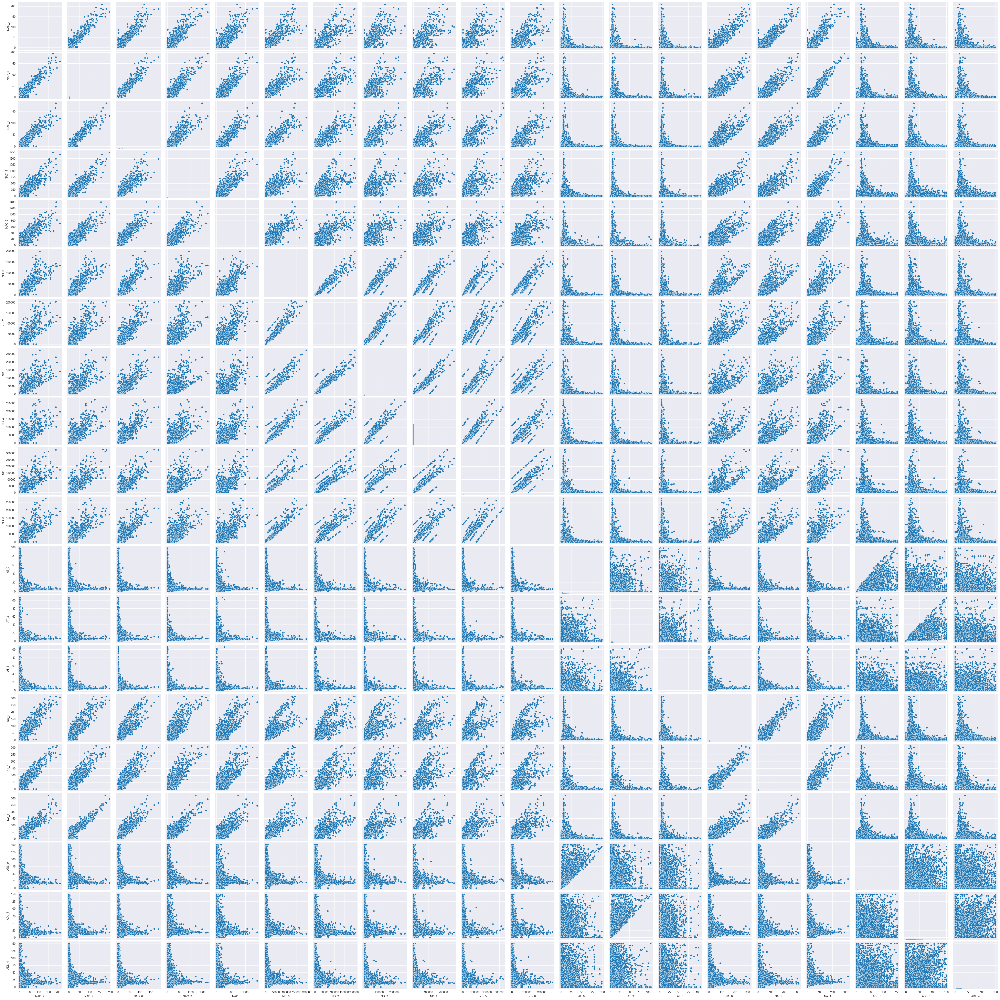

In [55]:
sns.pairplot(dn)
plt.show()

# Отсутствие мультиколлинеарности



In [28]:
cols_num = ['NCD_0','NCD_1','NCD_2','NCD_5','BL_0','BL_3','BL_6','BL_7','NAD_0','NAD_1','NAD_2','NAD_3','NAD_4','NAD_5','NAD_6','NAD_7','AI_1','AI_2','AI_5','AI_6','AI_7','NAC_0','NAC_1','NAC_2','NAC_3','NAC_4','NAC_5','NAC_6','ND_0','ND_1','ND_2','ND_3','ND_4','ND_5','ND_6','ND_7','AT_1','AT_4','AT_7','NA_0','NA_2','NA_3','NA_4','NA_5','NA_7','ADL_1','ADL_4','ADL_5']

correlation = df.corr().loc[cols_num, cols_num]
correlation

,NCD_0,NCD_1,NCD_2,NCD_5,BL_0,BL_3,BL_6,BL_7,NAD_0,NAD_1,...,AT_7,NA_0,NA_2,NA_3,NA_4,NA_5,NA_7,ADL_1,ADL_4,ADL_5
NCD_0,1.000000,0.911824,0.912067,0.890870,0.308223,0.206778,0.201793,0.221151,0.968317,0.920931,...,0.059521,0.906290,0.867572,0.849260,0.839172,0.825759,0.803092,0.115689,0.080266,0.074839
NCD_1,0.911824,1.000000,0.936091,0.918456,0.232351,0.211840,0.208183,0.223109,0.935117,0.972015,...,0.058793,0.908576,0.897896,0.873379,0.864735,0.854281,0.832446,0.109472,0.085002,0.076273
NCD_2,0.912067,0.936091,1.000000,0.923510,0.238106,0.213201,0.217396,0.230143,0.933266,0.939165,...,0.060683,0.901849,0.922375,0.883470,0.869433,0.859005,0.844986,0.124637,0.092462,0.083281
NCD_5,0.890870,0.918456,0.923510,1.000000,0.249568,0.230995,0.219711,0.247629,0.923348,0.932845,...,0.067033,0.895696,0.893612,0.884885,0.888720,0.918523,0.881953,0.136815,0.097886,0.084405
BL_0,0.308223,0.232351,0.238106,0.249568,1.000000,0.267524,0.266759,0.258564,0.268431,0.250138,...,0.112223,0.316300,0.274763,0.274357,0.279665,0.283095,0.291270,0.195933,0.166678,0.157309
BL_3,0.206778,0.211840,0.213201,0.230995,0.267524,1.000000,0.257667,0.246708,0.218742,0.219681,...,0.103382,0.242337,0.238674,0.306072,0.269156,0.263741,0.270322,0.167183,0.181452,0.164490
BL_6,0.201793,0.208183,0.217396,0.219711,0.266759,0.257667,1.000000,0.231930,0.218924,0.220587,...,0.123021,0.248579,0.249385,0.247816,0.246621,0.245146,0.284599,0.172115,0.139804,0.120812
BL_7,0.221151,0.223109,0.230143,0.247629,0.258564,0.246708,0.231930,1.000000,0.237459,0.237467,...,0.107226,0.265558,0.268902,0.267321,0.271074,0.275270,0.357154,0.179069,0.146121,0.133322
NAD_0,0.968317,0.935117,0.933266,0.923348,0.268431,0.218742,0.218924,0.237459,1.000000,0.969016,...,0.087968,0.959514,0.925982,0.912613,0.901308,0.889431,0.871871,0.158199,0.114991,0.105742
NAD_1,0.920931,0.972015,0.939165,0.932845,0.250138,0.219681,0.220587,0.237467,0.969016,1.000000,...,0.088443,0.951769,0.934431,0.922171,0.910412,0.901055,0.880701,0.169715,0.117208,0.107437


<AxesSubplot: >

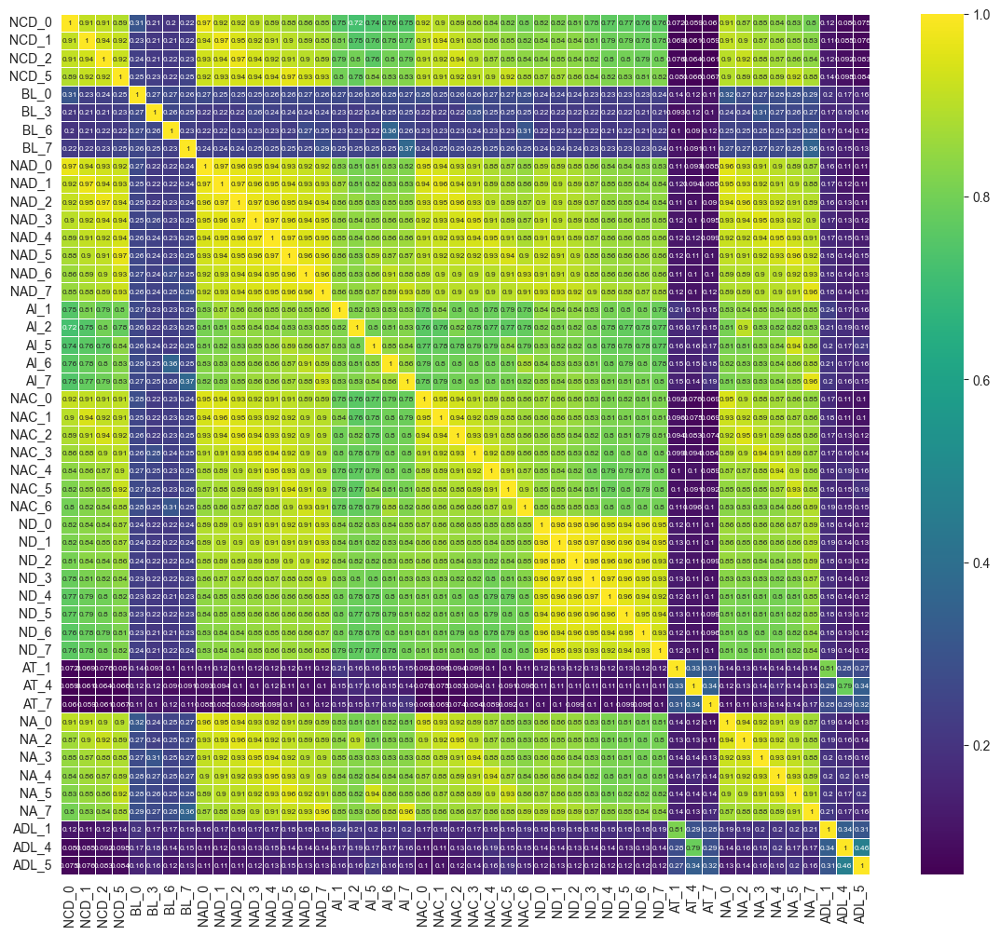

In [42]:

fig , ax = plt.subplots(figsize = (14,12))

sns.heatmap(correlation, 
            linewidths=0.5, annot=True,cmap='viridis',
            linecolor="white", annot_kws = {'size':6})

In [29]:
vif = [variance_inflation_factor(X_train.values, i) for i in range(X_train.shape[1])]
pd.DataFrame({'vif': vif[0:]}, index=X_train.columns).T

# удалить
# NCD_0 NCD_1 NCD_2 NCD_3 NCD_4 NCD_5 NCD_6 NCD_7
# NAD_0 NAD_1 NAD_2 NAD_3 NAD_4 NAD_5 NAD_6 NAD_7
# AI_1 AI_2 AI_3 AI_4 AI_5 AI_6 AI_7
# NAC_0 NAC_1 NAC_2 NAC_3 NAC_4 NAC_5 NAC_6 NAC_7
# ND_0 ND_1 ND_2 ND_3 ND_4 ND_5 ND_6 ND_7
# NA_0 NA_1 NA_2 NA_3 NA_4 NA_5 NA_6 NA_7
# AS(NA)_0 AS(NA)_1 AS(NA)_2 AS(NA)_3 AS(NA)_4 AS(NA)_5 AS(NA)_6 AS(NA)_7
# AS(NAC)_0 AS(NAC)_1 AS(NAC)_2 AS(NAC)_3 AS(NAC)_4 AS(NAC)_5 AS(NAC)_6 AS_(NAC)_7

,NCD_0,NCD_1,NCD_2,NCD_3,NCD_4,NCD_5,NCD_6,NCD_7,BL_0,BL_1,...,AS(NA)_6,AS(NA)_7,AS(NAC)_0,AS(NAC)_1,AS(NAC)_2,AS(NAC)_3,AS(NAC)_4,AS(NAC)_5,AS(NAC)_6,AS(NAC)_7
vif,40.608789,50.285661,43.068888,41.529815,45.452438,45.939047,39.766386,45.113893,2.11971,2.11425,...,176.161316,143.242766,67.002798,61.367849,57.992334,72.139669,72.07139,83.792427,76.973955,58.42811


In [30]:
dn = dn.drop(columns=['NCD_0', 'NCD_1', 'NCD_2', 'NCD_5', 'NAD_0', 'NAD_1', 'NAD_2', 'NAD_3', 'NAD_4', 'NAD_5', 'NAD_6', 'NAD_7', 'AI_1', 'AI_2', 'AI_5', 'AI_6', 'AI_7', 'NAC_0', 'NAC_1', 'NAC_2', 'NAC_3', 'NAC_4', 'NAC_5', 'NAC_6', 'ND_0', 'ND_1', 'ND_2', 'ND_3', 'ND_4', 'ND_5', 'ND_6', 'ND_7', 'NA_0', 'NA_2', 'NA_3', 'NA_4', 'NA_5', 'NA_7'])
dn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28179 entries, 0 to 28178
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   BL_0    28179 non-null  float64
 1   BL_3    28179 non-null  float64
 2   BL_6    28179 non-null  float64
 3   BL_7    28179 non-null  float64
 4   AT_1    28179 non-null  float64
 5   AT_4    28179 non-null  float64
 6   AT_7    28179 non-null  float64
 7   ADL_1   28179 non-null  float64
 8   ADL_4   28179 non-null  float64
 9   ADL_5   28179 non-null  float64
dtypes: float64(10)
memory usage: 2.2 MB


In [31]:
X_test = sm.add_constant(X_test)
y_pred = results.predict(X_test)
residual = y_test - y_pred

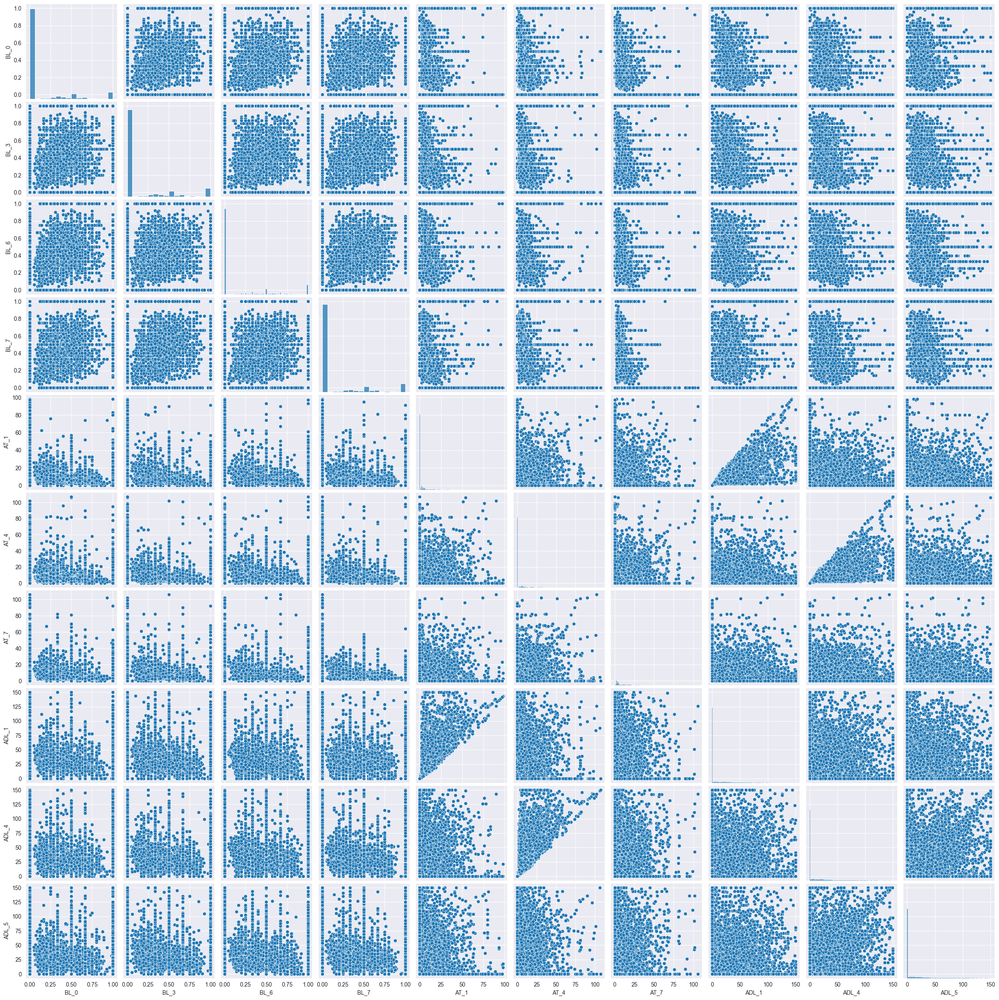

In [49]:
sns.pairplot(dn)
plt.show()

In [32]:
cols_num = ['BL_0', 'BL_3', 'BL_6', 'AT_1', 'AT_4', 'AT_7', 'ADL_1', 'ADL_4', 'ADL_5']

correlation = df.corr().loc[cols_num, cols_num]
correlation

,BL_0,BL_3,BL_6,AT_1,AT_4,AT_7,ADL_1,ADL_4,ADL_5
BL_0,1.000000,0.267524,0.266759,0.135570,0.115819,0.112223,0.195933,0.166678,0.157309
BL_3,0.267524,1.000000,0.257667,0.092789,0.116124,0.103382,0.167183,0.181452,0.164490
BL_6,0.266759,0.257667,1.000000,0.104468,0.089974,0.123021,0.172115,0.139804,0.120812
AT_1,0.135570,0.092789,0.104468,1.000000,0.331137,0.313321,0.812491,0.278831,0.274036
AT_4,0.115819,0.116124,0.089974,0.331137,1.000000,0.342212,0.293022,0.786149,0.336421
AT_7,0.112223,0.103382,0.123021,0.313321,0.342212,1.000000,0.277486,0.288042,0.317074
ADL_1,0.195933,0.167183,0.172115,0.812491,0.293022,0.277486,1.000000,0.336087,0.309252
ADL_4,0.166678,0.181452,0.139804,0.278831,0.786149,0.288042,0.336087,1.000000,0.461340
ADL_5,0.157309,0.164490,0.120812,0.274036,0.336421,0.317074,0.309252,0.461340,1.000000


<AxesSubplot: >

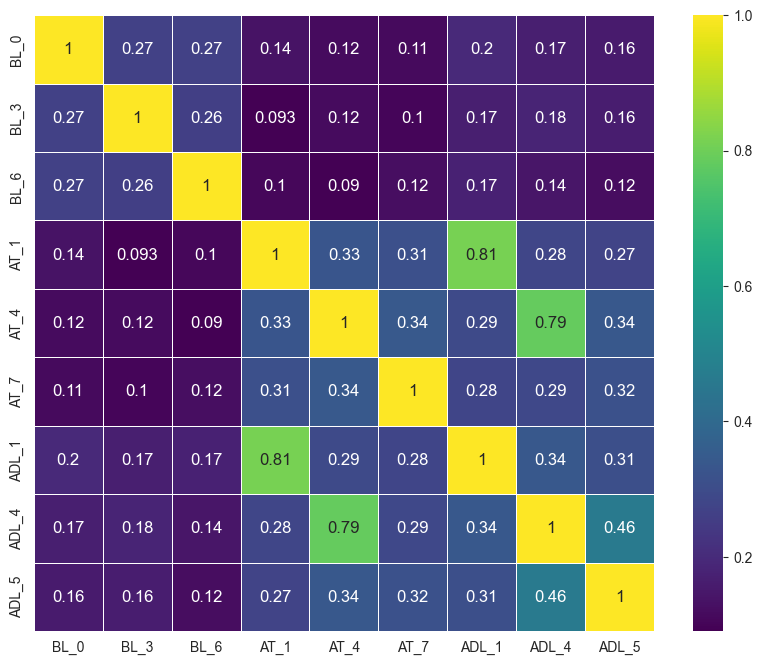

In [54]:
fig , ax = plt.subplots(figsize = (10,8))

sns.heatmap(correlation,
            linewidths=0.5, annot=True,cmap='viridis',
            linecolor="white", annot_kws = {'size':12})

In [48]:

# Split the data into train and test with 70% data being used for training
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size=0.30,
                                                    random_state=42)

In [49]:
X_with_constant = sm.add_constant(X_train)
model = sm.OLS(y_train, X_with_constant)
results = model.fit()
results.params

const    -325.550979
BL_0     5571.901747
BL_3     4035.342208
BL_6     4238.505439
BL_7     5579.669725
AT_1      -60.430497
AT_4       48.887242
AT_7       28.273266
ADL_1      64.725091
ADL_4      -0.325909
ADL_5      11.398231
dtype: float64

In [50]:
print(results.summary())

                            OLS Regression Results                            
Dep. Variable:                 Target   R-squared:                       0.125
Model:                            OLS   Adj. R-squared:                  0.125
Method:                 Least Squares   F-statistic:                     282.6
Date:                Fri, 20 Jan 2023   Prob (F-statistic):               0.00
Time:                        15:33:53   Log-Likelihood:            -2.1320e+05
No. Observations:               19725   AIC:                         4.264e+05
Df Residuals:                   19714   BIC:                         4.265e+05
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       -325.5510    114.584     -2.841      0.0

# Нормальное распределение ошибок


<AxesSubplot: ylabel='Density'>

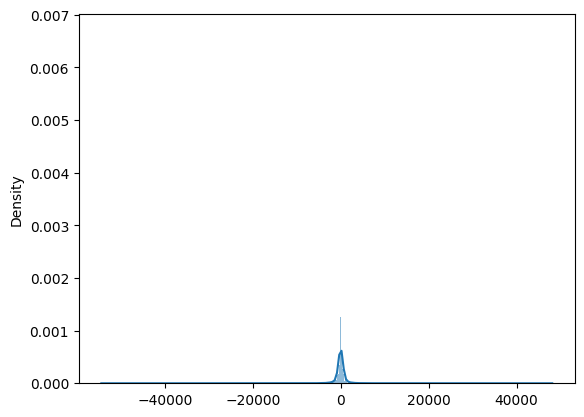

In [51]:
sns.histplot(residual, kde=True, stat="density", linewidth=0)
# многие ячейки в таблице с данными имеют большие значения, поэтому масштаб графика небольшой

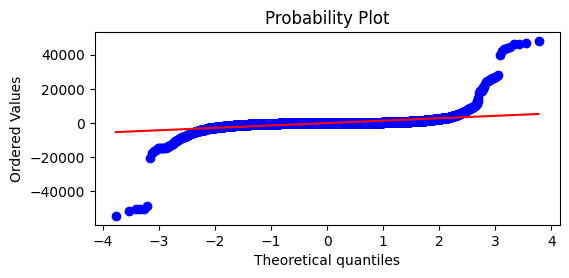

In [52]:
fig, ax = plt.subplots(figsize=(6,2.5))
_, (__, ___, r) = sp.stats.probplot(residual, plot=ax, fit=True)

# Гомоскедастичность

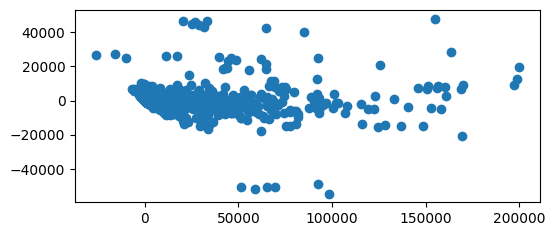

In [53]:
fig, ax = plt.subplots(figsize=(6,2.5))
_ = ax.scatter(y_pred, residual)

# Отсутствие автокорреляции остатков

C:\Users\adeli\AppData\Local\Temp\ipykernel_15640\4011761602.py:2: UserWarning: Matplotlib is currently using module://matplotlib_inline.backend_inline, which is a non-GUI backend, so cannot show the figure.
  acf.show()


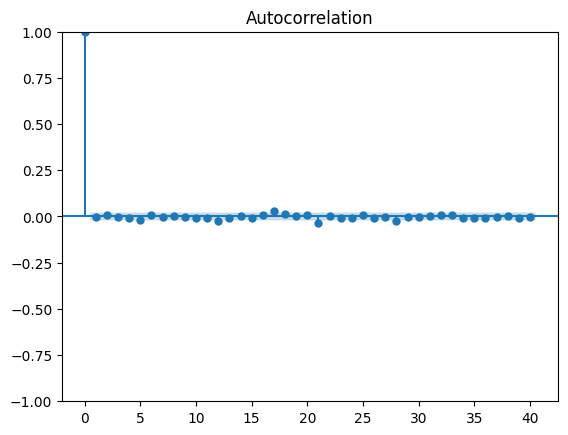

In [54]:
acf = smt.graphics.plot_acf(residual, lags=40 , alpha=0.05)
acf.show()


## Коэффициенты
### Матрицы

### $\beta^* = (X^T \cdot X)^{-1}\cdot X^T \cdot Y$



In [55]:
np.set_printoptions(suppress=True)

x1 = np.matrix(X_with_constant.to_numpy())
y1 = y_train.to_numpy()
beta = (x1.T @ x1).I @ x1.T @ y1
beta

matrix([[-325.55097939, 5571.90174662, 4035.34220786, 4238.50543948,
         5579.66972512,  -60.43049709,   48.8872423 ,   28.27326593,
           64.72509142,   -0.32590895,   11.39823148]])

### Градиентный спуск

Инициализируем случайную точку (часто берут просто нули):

$$
\beta_0 = (0\;\; 0 ...)
$$

Итеративно скачем по линиям уровня нашей функции, шагая каждый раз в сторону антиградиента с корректировкой шага $\eta_k$:

$$
\beta_{k+1} = \beta_k - \eta_{k}\cdot\nabla Q(\beta_k, X)
$$
 
Останавливаемся, когда срабатывает критерий останова. Например:

$$
|\beta_{k+1} - \beta_k| < \xi
$$

Пусть имеем 3 объекта $(X, Y)^i$ = $\left((d_i, 1), Y_i \right)$ с 3 признаками $d_1$, $d_2$ (+ константа). Хотим оценить обычную линейную модель:

$$
a(x) = \beta_1 \cdot d_1 + \beta_2 \cdot d_2 + \beta_0
$$

Тогда функционал ошибки как среднеквадратическая ошибка на нашей выборке выглядит следующим образом:

$$
Q(a, X) = \frac{1}{N}\cdot\sum_{i=1}^N (\beta_1 \cdot d_{i1} + \beta_2 \cdot d_{i2} + \beta_0 - y_i)^2
$$

Посчитаем вектор-градиент по всем оцениваемым параметрам:

$$
\nabla Q(a, X) = (Q'_{\beta_1} \;\;\; Q'_{\beta_2} \;\;\; Q'_{\beta_0})
$$

Пример расчета производной по параметру у признака номер 1:

$$
Q'_{\beta_1} = \frac{2}{N} \cdot \sum_{i=1}^N d_{i1} \cdot (\beta_1 \cdot d_{i1} + \beta_2 \cdot d_{i2} + \beta_0 - y_i)
$$

In [61]:
def calc_grad(X: np.ndarray, y: np.ndarray, w: np.ndarray) -> np.ndarray:
    return 2*X.T.dot(X.dot(w)-y) / X.shape[0]
def gradient_descent(w_init: np.ndarray, X: np.ndarray, y: np.ndarray, lr: float, n_iterations: int = 100000):

    w_0 = np.random.uniform(-2, 2, (w_init.shape[0])) # random unit
    w = w_0.copy()
    w_list = [w.copy()]

    for i in range(n_iterations): # hoping through function
        w -= lr * calc_grad(X, y, w)
    w_list.append(w.copy())

    return np.array(w_list)

In [62]:
w = np.random.uniform(0,0,X_with_constant.shape[1])
w_list = gradient_descent(w,X_with_constant,y_train,0.00001,100000)
w_list

array([[  -0.79692099,    0.36085378,   -1.72991123,    1.01581793,
           0.52102876,   -1.77581796,   -1.27581108,   -1.88051785,
           0.27713341,   -1.25474185,   -1.70145386],
       [ 992.27507961, 1236.69196346, 1158.88547355, 1275.85936137,
        1348.55278474, -112.77915126,   18.07423967,   62.05798149,
         104.71806262,   23.29834715,   22.75201069]])

In [67]:
np.set_printoptions(suppress=True)

N = X_with_constant.shape[0]
ROWS_COUNT = X_with_constant.shape[1]
params = np.zeros(ROWS_COUNT)
X2 = X_with_constant.to_numpy()
y2 = y_train.to_numpy()

lr = 3.5 * 10e-5
eps = 0.00001
errors = [1, 0]
grad = np.zeros(ROWS_COUNT)

while abs(errors[-1] - errors[-2]) > eps:
  predictions = (params @ X2.T).T

  error = (1/N) * sum((predictions - y2) ** 2)
  errors.append(error)

  for feat in range(ROWS_COUNT):
    grad[feat] = 2/N * sum(X2[:, feat] * (predictions - y2))
    params[feat] -= lr * grad[feat]

print(params)

KeyboardInterrupt: 

# Заключение
В процессе выполнения задания была проведена работа с датафреймом: все строковые и символьные значения были приведены в числовой вид, после чего был проведен анализ. С выбором целевого столбца было произведено построение регрессионной зависимости, затем модель была переобучена без незначимых параметров. Также была проведена проверка на мультиколлинеарность параметров, нормальное распределение ошибок, гомокседатичность, отсутствие автокорреляции остатков.
В заключительной части работы было проведено повторное вычисление коэффициентов регрессионной зависимости с использованием метода матриц и метода градиентного спуска. Коэффициенты, полученные методом матриц, сходятся с коэффициентами, полученными с использованием statsmodel. Метод градиентного спуска же выдал некорректные результаты, что может быть связано с ошибкой в исходных данных.